# Original Work Presented in this notebook
This notebook constructs models on the synthetic data for a fixed irradiation time of 1 hour. These models are analyzed via learning curves, feature importance plots, and performance tests on a test dataset.

# Setting up the notebook

In [2]:
import numpy as np
from sklearn.preprocessing import StandardScaler
import numpy as np
import pandas as pd
import sklearn as sk
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import scikitplot as skplt
import time
warnings.simplefilter(action='ignore')  
sns.set_context("talk")
sns.set_style("dark")
pd.set_option('display.max_columns', 100)
# Models I will use
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import Lasso
from sklearn.linear_model import SGDRegressor
from sklearn.svm import SVR
from sklearn.linear_model import ElasticNet
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostRegressor
from sklearn.decomposition import PCA

# Various other tools in sklearn I will use
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score

# Importing pre-built functions

## Later I will add the notes which describe each of these functions.

In [3]:
def new_full_pipeline(w, test_size, sigma, mu, n, seed):
    
    u235, u238, u234, u236 = pd.read_csv(
        'SCALE/multi_irrad_times/u235_1hr.csv', skipinitialspace=True).T, pd.read_csv(
        'SCALE/multi_irrad_times/u238_1hr.csv', skipinitialspace=True).T, pd.read_csv(
        'SCALE/multi_irrad_times/u234_1hr.csv', skipinitialspace=True).T, pd.read_csv(
        'SCALE/multi_irrad_times/u236_1hr.csv', skipinitialspace=True).T
    
    u235.columns, u238.columns, u234.columns, u236.columns = u235.iloc[0], u238.iloc[0], u234.iloc[0], u236.iloc[0]
    
    columns = u235.columns
    
    u235 = u235.drop(index=['boundaries'])
    u238 = u238.drop(index=['boundaries'])
    u234 = u234.drop(index=['boundaries'])
    u236 = u236.drop(index=['boundaries'])
    
    imputer = SimpleImputer(fill_value=0, strategy="constant")    
    u235_values = imputer.fit_transform(u235.values)
    u238_values = imputer.fit_transform(u238.values)
    u234_values = imputer.fit_transform(u234.values)
    u236_values = imputer.fit_transform(u236.values)

    X, y = new_centrifuge(w=w, iso1 = u238_values, iso2 = u235_values, iso3 = u234_values, iso4 = u236_values)
    
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=test_size, random_state=seed)
    
    X_train, X_test = two_d_scaler(X_train, X_test)
    
    X_train, y_train = replicate_gauss_noise(
        X_train, y_train, sigma, mu, n)
    X_test, y_test = replicate_gauss_noise(
        X_test, y_test, sigma, mu, n)
    
    return X_train, X_test, y_train, y_test, columns

In [4]:
def new_centrifuge(w, iso1, iso2, iso3, iso4):
    """`w` is an array of all enrichment levels that you want to generate.
    Enrichment refers to the atom percent of iso2
    iso1, iso2, iso3, iso4 = U238, U235, U234, U236"""
    
    X = iso1
    y = np.zeros(iso1.shape[0])
    for enrichment in w:
        
        abundance4 = u4(enrichment)
        abundance6 = u6(enrichment)
        
        enriched = (enrichment * iso2) + (abundance4 * iso3) + (abundance6 * iso4) + ((1 - enrichment - abundance4 - abundance6) * iso1)
        
        X = np.append(X, enriched, axis=0)
        for j in range(0, iso1.shape[0]):
            y = np.append(y, enrichment)
    return X, y
        

In [5]:
def u6(enrichment):
    abundance6 = 0.0004 * enrichment ** 2 + 0.0045 * enrichment - 2e-5
    return abundance6

def u4(enrichment):
    abundance4 = 0.0053 * enrichment ** 2 + 0.0058 * enrichment + 4e-5
    return abundance4

In [6]:
def two_d_scaler(X_train, X_test):
    """This function performs normalization across features per instance,
    and scaling to zero-centered with unit variance across instances per 
    feature."""
    for x in [X_train, X_test]: # Normalization
        total = np.sum(x, axis=1)
        for i in range(0,len(x[:,0])):
            x[i] = x[i] / total[i]
    # scaler = StandardScaler()
    # X_train = scaler.fit_transform(X_train)
    # X_test = scaler.transform(X_test)
    return X_train, X_test

In [72]:
def reg_comp(seed, X_train, y_train, X_test, y_test, ridge, 
             decision_tree, lasso, elastic_net, random_forest,
            adaboost_reg):
    """This is the help documentation for regression comparison"""
    seed = seed

    models = []
    models.append(('Ridge', ridge))    
    models.append(('Lasso', lasso))
    models.append(('Elastic Net', elastic_net))
    models.append(('Decision Tree', decision_tree))
    models.append(('Random Forest', random_forest))
    models.append(('AdaBoost Forest', adaboost_reg))

    results = []
    names = []
    scoring = 'neg_mean_absolute_error'
    
    print("Model: Mean (Standard Deviation)")

    for name, model in models:
        model.fit(X_train, y_train)
        pred = model.predict(X_test)
        result = abs(pred - y_test)
        results.append(result)
        names.append(name)
        msg = "%s: %f (%f)" % (name, result.mean(), result.std())
        print(msg)
    
    fig = plt.figure(figsize=(6, 6), dpi=1200)
    fig.suptitle("Regression Algorithm Performance Comparison")
    ax = fig.add_subplot(111)
    # sns.boxplot(data=results_cc_reg, linewidth=1, color='orange')
    sns.violinplot(data=results, cut=0, width=1, linewidth=.8,
                   inner='point', orient='h', scale='area')
    ax.set_yticklabels(names)
    plt.xscale('linear')
    plt.xlabel("MAE")
    plt.xlabel("Absolute Prediction Error Distribution")
    plt.xticks(rotation=30)
    plt.yticks(rotation=0)
    plt.savefig('ORNL_figures/regression_comparison.png')
    plt.show()

    return results, names

In [8]:
def model_gsearch_cval(model, X_train, y_train, param_grid, cv, scorer):
    grid_search = GridSearchCV(model, param_grid, cv=cv,
                               scoring=scorer)
    grid_search.fit(X_train, y_train)
    gs_results = pd.DataFrame(grid_search.cv_results_).sort_values(
        by=['rank_test_score'])
    grid_search.best_estimator_
    scores = cross_val_score(
                grid_search.best_estimator_, X_train, y_train, cv=cv,
                scoring=scorer)
    # rmse_scores = np.sqrt(-scores)
    Message = print("Cross-validation statistics for best model:",
                    'Scores:', scores, 'Mean:', scores.mean(), 
                    'Standard Deviation:', scores.std())
    return gs_results, grid_search.best_estimator_, grid_search, Message

In [9]:
def gauss_noise(X, sigma, mu):
    noise = sigma * np.random.randn(X.shape[0], X.shape[1]) + mu
    X_noise = X * ( 1 + noise)
    return X_noise

In [10]:
def replicate_gauss_noise(X, y, sigma, mu, n):
    X_rep = X
    y_rep = y
    for i in range(n):
        X_n = gauss_noise(X, sigma, mu)
        X_rep = np.append(X_rep, X_n, axis=0)
        y_rep = np.append(y_rep, y, axis=0)
    return X_rep, y_rep

# Setting up all of the data for this notebook

In [11]:
w = np.array([0.0002, 0.0071, 0.03, 0.20, 0.50, 0.63, 0.97])

X_train, X_test, y_train, y_test, columns = new_full_pipeline(
    w=w, test_size=0.2, sigma=0.05, mu=0, n=0, seed=42)

## Regularized Linear Models
Ordinary Least Squares objective function: 

$$\min_{m}||Xw-y||^{2}$$

__Regularization__: Penalty for complexity, given by $\alpha{}$. 

Ridge Regression: $$\min_{m}||Xw-y||^{2}_{2}+0.5\alpha{}||w||^{2}_{2}$$

Lasso: $$\min_{m}||Xw-y||^{2}_{2}+\alpha{}||w||_{1}$$

Elastic Net: $$\min_{m}||Xw-y||^{2}_{2}+\alpha{}L_{1}||w||_{1}+0.5\alpha(1-L_{1})||w||^{2}_{2}$$

## Gradient Descent Step
$$w^{(next)}=w-\eta{}\nabla_{w}MSE(w)$$

## Ridge Regression

In [14]:
param_grid=[{
    'alpha': [1e-3, 1e-2, 1e-1,
              1, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20,
              1e2, 2,
              1e3, 1.1e3, 1e4, 1e5,], 
    'solver': ['auto', 'svd', 'cholesky']
}]

results_ridge, best_ridge, ridge_search, Message= model_gsearch_cval(
    model=Ridge(random_state=42), X_train=X_train, y_train=y_train,
    param_grid=param_grid, cv=5, scorer="neg_mean_absolute_error")

Cross-validation statistics for best model: Scores: [-0.20885933 -0.18146698 -0.22259362 -0.21559404 -0.22375483] Mean: -0.21045376261949653 Standard Deviation: 0.01544987251459447


In [15]:
best_ridge

Ridge(alpha=15, copy_X=True, fit_intercept=True, max_iter=None, normalize=False,
      random_state=42, solver='svd', tol=0.001)

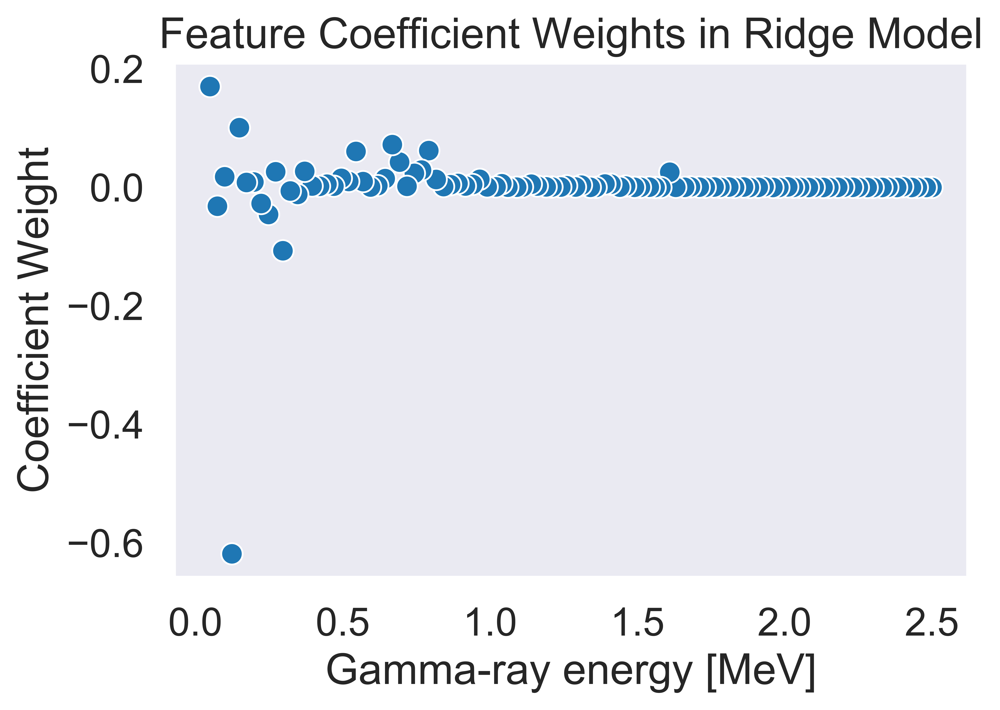

In [17]:
fig = plt.figure(figsize=(6, 4), dpi=1200)
sns.scatterplot(x=columns, y=best_ridge.coef_)
plt.title("Feature Coefficient Weights in Ridge Model")
plt.xlabel("Gamma-ray energy [MeV]")
plt.ylabel("Coefficient Weight")
plt.savefig('diss_figures/ridge_coefs.png')

In [18]:
columns = np.round(columns, decimals=3)

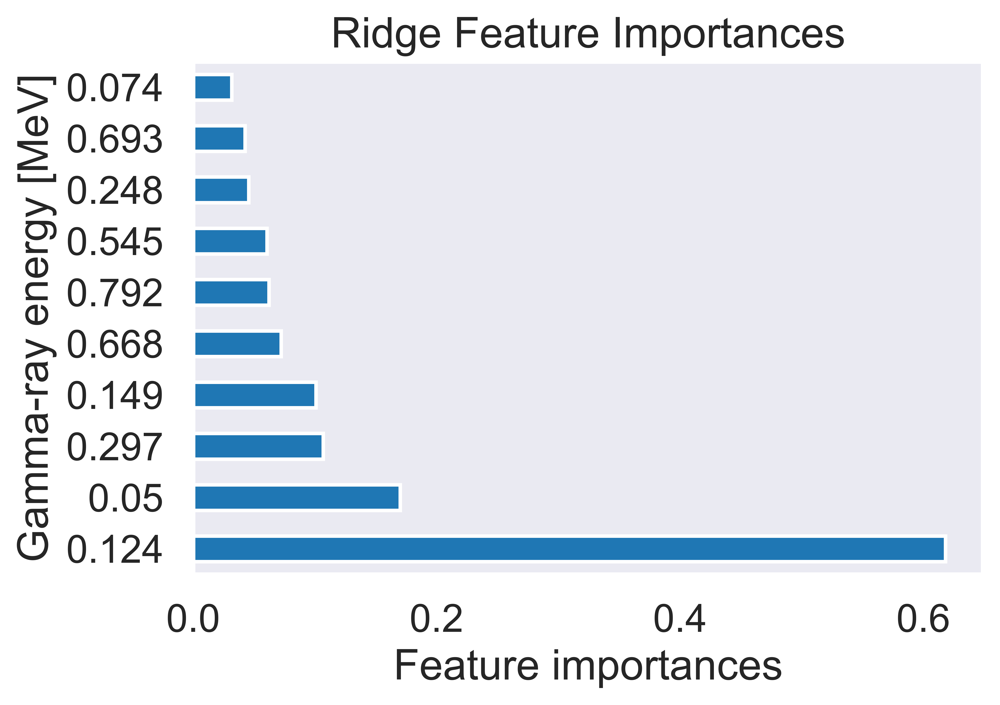

In [19]:
fig = plt.figure(figsize=(6,4), dpi=1200)
feat_importances = pd.Series(abs(best_ridge.coef_), index=columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.title("Ridge Feature Importances")
plt.xlabel("Feature importances")
plt.ylabel("Gamma-ray energy [MeV]")
plt.savefig('diss_figures/new_ridge_feature_importances.png')

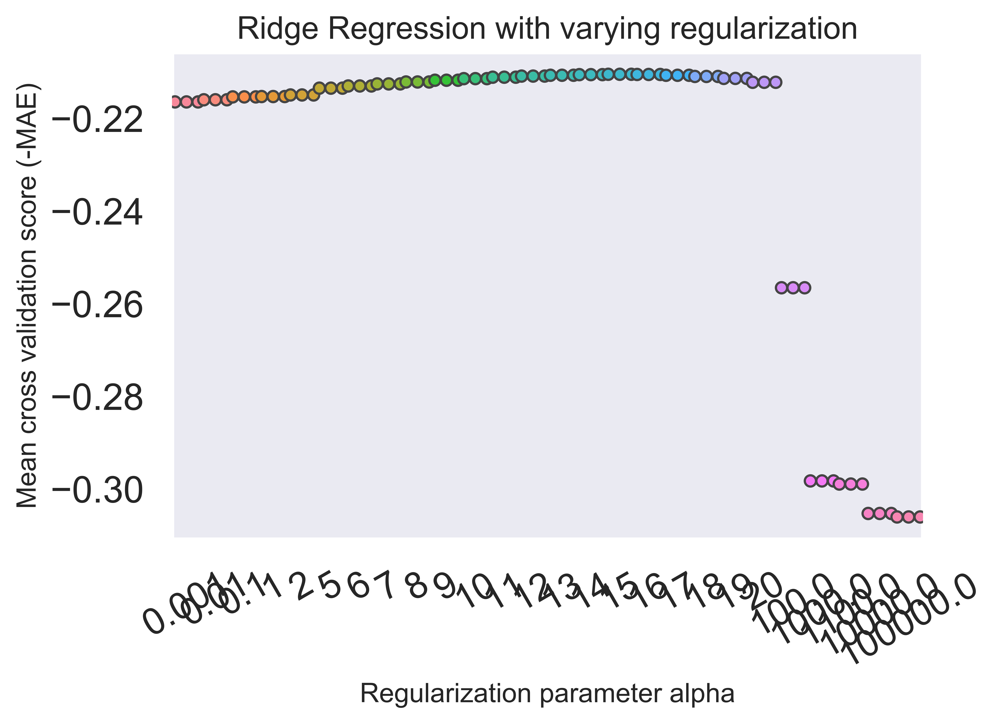

In [20]:
fig = plt.figure(figsize=(6,4), dpi=1200)
sns.swarmplot(data=results_ridge, x="param_alpha",
              y="mean_test_score", linewidth=1)
plt.xticks(rotation=30)
plt.title("Ridge Regression with varying regularization", fontsize=14)
plt.xlabel("Regularization parameter alpha", fontsize=12)
plt.ylabel("Mean cross validation score (-MAE)", fontsize=12)
plt.savefig('diss_figures/ridge_alpha.png')


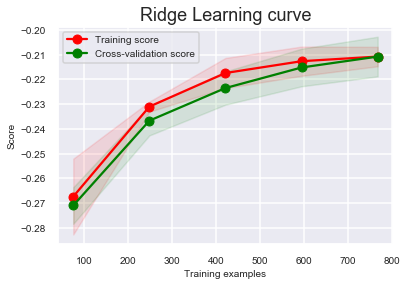

In [21]:
skplt.estimators.plot_learning_curve(best_ridge, X_train, y_train,
                                    scoring="neg_mean_absolute_error",
                                    title="Ridge Learning Curve")
plt.title("Ridge Learning curve")
plt.savefig('diss_figures/ridge_lc.png')
plt.show()

## Lasso

In [22]:
param_grid = [{
    'alpha': [1e-6, 1e-5, 1e-4, 1e-3, 5e-3, 1e-2, 5e-2, 1e-1, 1, 10], 
    'random_state': [42],
    'tol': [1, 1e-1, .02, .03, .04, .05, .06, .07, 0.08, .09, 1e-2, 1e-3],
    'max_iter': [10, 20, 40, 60, 80, 1e2, 1e3]
}]

results_lasso, best_lasso, lasso_search, Message = model_gsearch_cval(
    model=Lasso(),X_train=X_train, y_train=y_train,
     param_grid=param_grid, cv=5, scorer="neg_mean_absolute_error")

Cross-validation statistics for best model: Scores: [-0.20909036 -0.18178006 -0.22263172 -0.21550475 -0.22397282] Mean: -0.21059594075036125 Standard Deviation: 0.015365670019696052


In [23]:
best_lasso

Lasso(alpha=0.01, copy_X=True, fit_intercept=True, max_iter=10, normalize=False,
      positive=False, precompute=False, random_state=42, selection='cyclic',
      tol=1, warm_start=False)

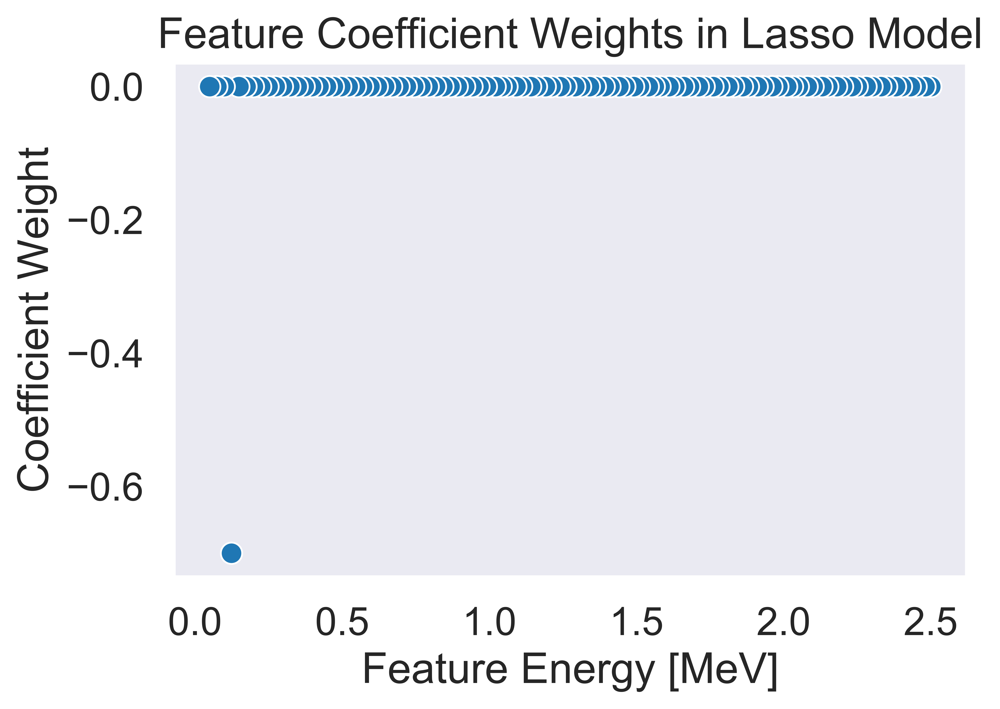

In [24]:
fig = plt.figure(figsize=(6, 4), dpi=1200)
sns.scatterplot(x=columns, y=best_lasso.coef_)
plt.title("Feature Coefficient Weights in Lasso Model")
plt.xlabel("Feature Energy [MeV]")
plt.ylabel("Coefficient Weight")
plt.savefig('diss_figures/lasso_coefs.png')

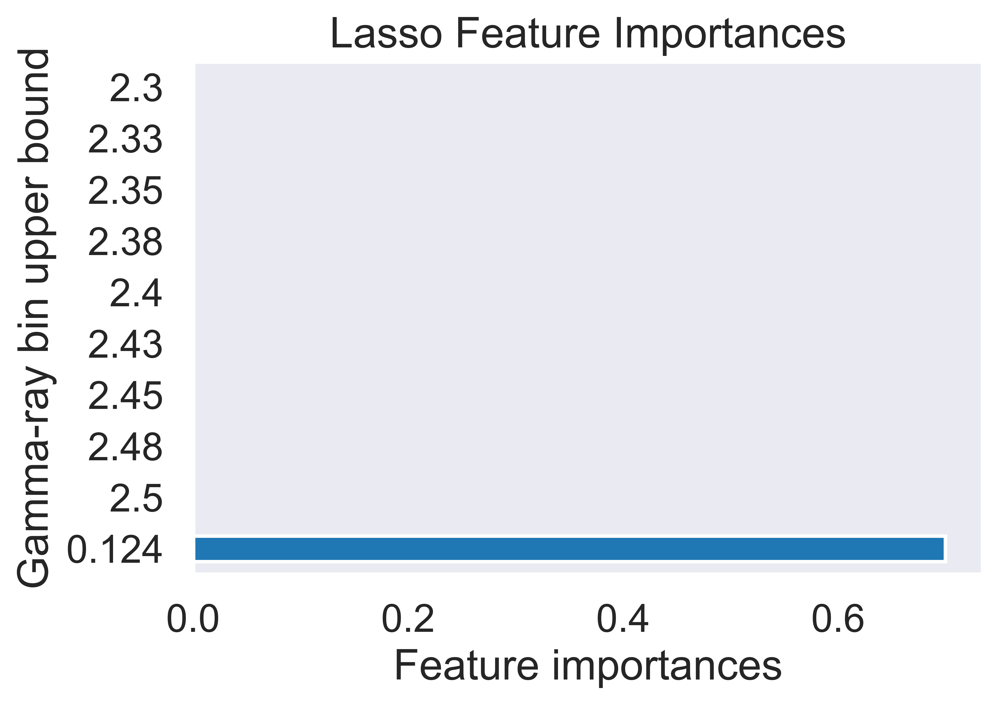

In [25]:
fig = plt.figure(figsize=(6,4), dpi=1200)
feat_importances = pd.Series(abs(best_lasso.coef_), index=columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.title("Lasso Feature Importances")
plt.xlabel("Feature importances")
plt.ylabel("Gamma-ray bin upper bound")
plt.savefig('diss_figures/new_lasso_feature_importances.png')

<Figure size 7200x4800 with 0 Axes>

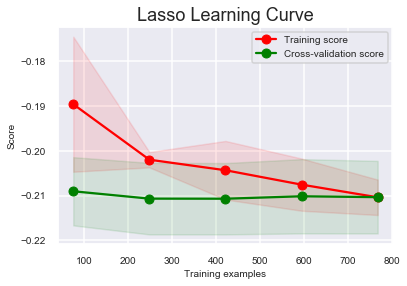

In [26]:
fig = plt.figure(figsize=(6, 4), dpi=1200)
skplt.estimators.plot_learning_curve(best_lasso, X_train, y_train,
                                    scoring="neg_mean_absolute_error")
plt.title("Lasso Learning Curve")
plt.show()

## Elastic Net

In [27]:
param_grid = [{
    'alpha': [1e-7, 1e-6, 1e-5, 1e-4, 1e-3,5e-3, 6e-3, 7e-3, 8e-3, 9e-3,
              1e-2, .02, .03, .04,
              5e-2, 1e-1, 1, 15], 
    'l1_ratio': [0, 0.1, 0.2, 0.3, 0.4, 0.5],
    'random_state': [42],
}]

results_elastic, best_elastic, elastic_search, Message = model_gsearch_cval(
    model=ElasticNet(), X_train=X_train, y_train=y_train,
    param_grid=param_grid, cv=5, scorer="neg_mean_absolute_error")

Cross-validation statistics for best model: Scores: [-0.20811903 -0.18285753 -0.22324812 -0.21584534 -0.2239322 ] Mean: -0.21080044365869396 Standard Deviation: 0.015105196048816272


In [28]:
best_elastic

ElasticNet(alpha=0.01, copy_X=True, fit_intercept=True, l1_ratio=0.5,
           max_iter=1000, normalize=False, positive=False, precompute=False,
           random_state=42, selection='cyclic', tol=0.0001, warm_start=False)

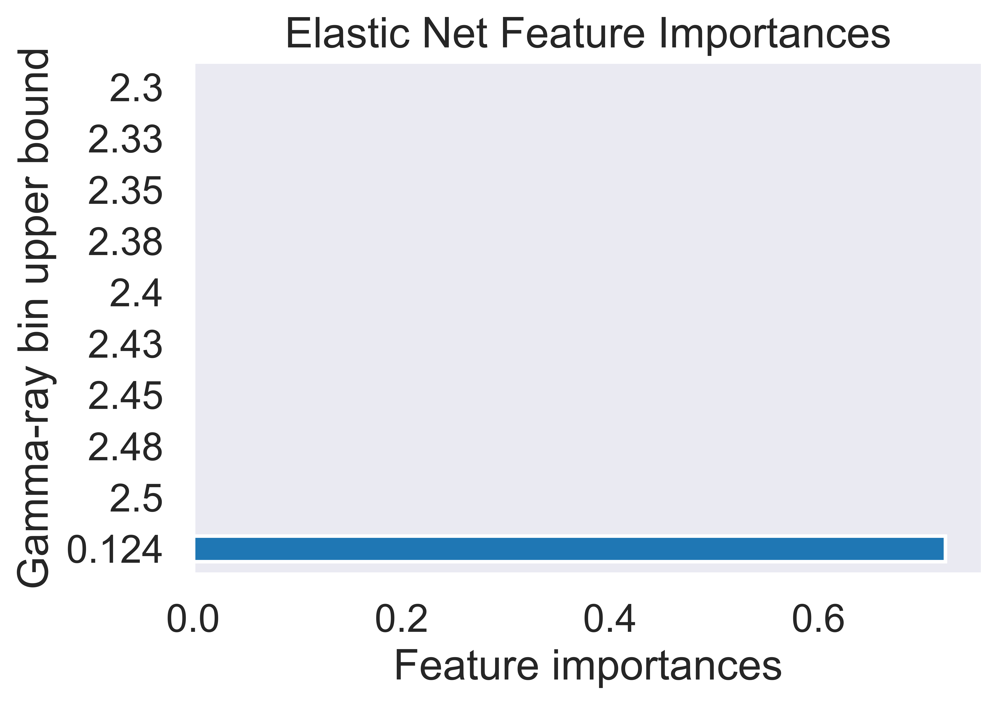

In [29]:
fig = plt.figure(figsize=(6,4), dpi=1200)
feat_importances = pd.Series(abs(best_elastic.coef_), index=columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.title("Elastic Net Feature Importances")
plt.xlabel("Feature importances")
plt.ylabel("Gamma-ray bin upper bound")
plt.savefig('diss_figures/elastic_feature_importances.png')

<Figure size 7200x4800 with 0 Axes>

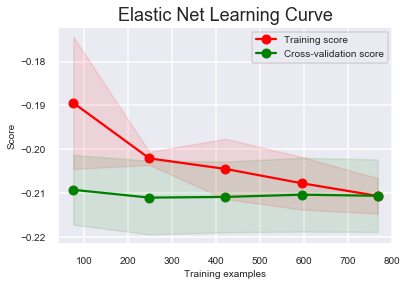

In [30]:
fig = plt.figure(figsize=(6, 4), dpi=1200)
skplt.estimators.plot_learning_curve(best_elastic, X_train, y_train,
                                    scoring="neg_mean_absolute_error")
plt.title("Elastic Net Learning Curve")
plt.show()

## Decision Tree Regressor
## CART cost function for regression
$$J(k, t_{k})=\frac{m_{left}}{m}MAE_{left}+\frac{m_{right}}{m}MAE_{right}$$

where $MAE_{node}=\sum_{i\in{}node}|\hat{y}_{node}-y^{(i)}|$
and $\hat{y}=\frac{1}{m_{node}}\sum_{i\in{}node}y^{(i)}$

In [31]:
tick = time.time()
param_grid= [{
    'criterion': ['mae'], 'splitter': ['best'], 
    'max_depth': [9, 11, 13, None],  
    'min_samples_split': [2], 'min_samples_leaf': [1, 2, 3, 4], 
    'max_features': [None], 'max_leaf_nodes': [20, 40], 
    'random_state': [42]
}]

results_tree_reg, best_tree_reg, tree_search, Message = model_gsearch_cval(
    model=DecisionTreeRegressor(), X_train=X_train, y_train=y_train,
    param_grid=param_grid, cv=5, scorer="neg_mean_absolute_error")
tock = time.time()
print("This grid-search took:", tock-tick, "seconds.")

Cross-validation statistics for best model: Scores: [-0.02191732 -0.01630216 -0.0220687  -0.01504348 -0.01863043] Mean: -0.018792417843026536 Standard Deviation: 0.0028559108209672565
This grid-search took: 40.824036836624146 seconds.


In [32]:
best_tree_reg

DecisionTreeRegressor(criterion='mae', max_depth=None, max_features=None,
                      max_leaf_nodes=40, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=3,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=42, splitter='best')

<Figure size 7200x4800 with 0 Axes>

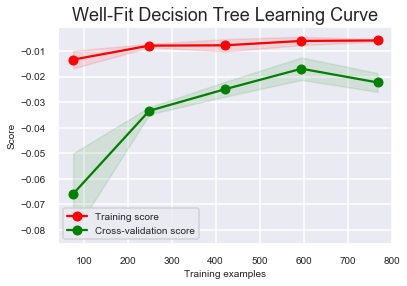

In [33]:
fig = plt.figure(figsize=(6,4), dpi=1200)
skplt.estimators.plot_learning_curve(best_tree_reg, X_train, y_train,
                                    scoring="neg_mean_absolute_error")
plt.title('Well-Fit Decision Tree Learning Curve')
plt.savefig('diss_figures/tree_learning_curve.png')
plt.show()

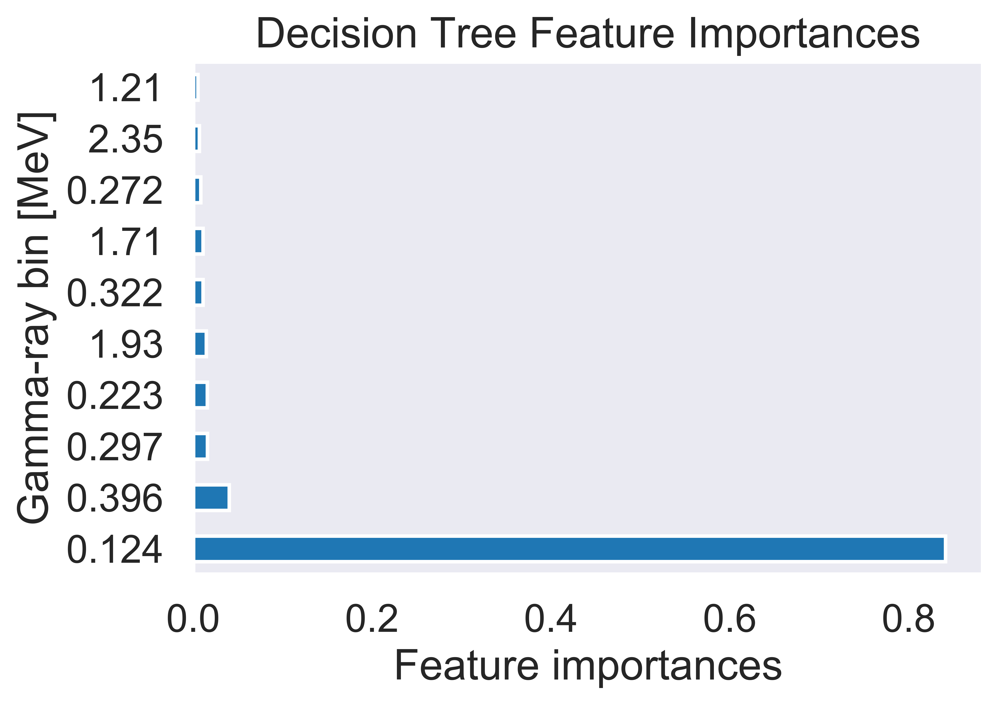

In [34]:
fig = plt.figure(figsize=(6,4), dpi=1200)
feat_importances = pd.Series(best_tree_reg.feature_importances_, 
                             index=np.round(columns, decimals=3))
feat_importances.nlargest(10).plot(kind='barh')
plt.title("Decision Tree Feature Importances")
plt.xlabel("Feature importances")
plt.ylabel("Gamma-ray bin [MeV]")
plt.savefig('diss_figures/new_tree_feature_importances.png')

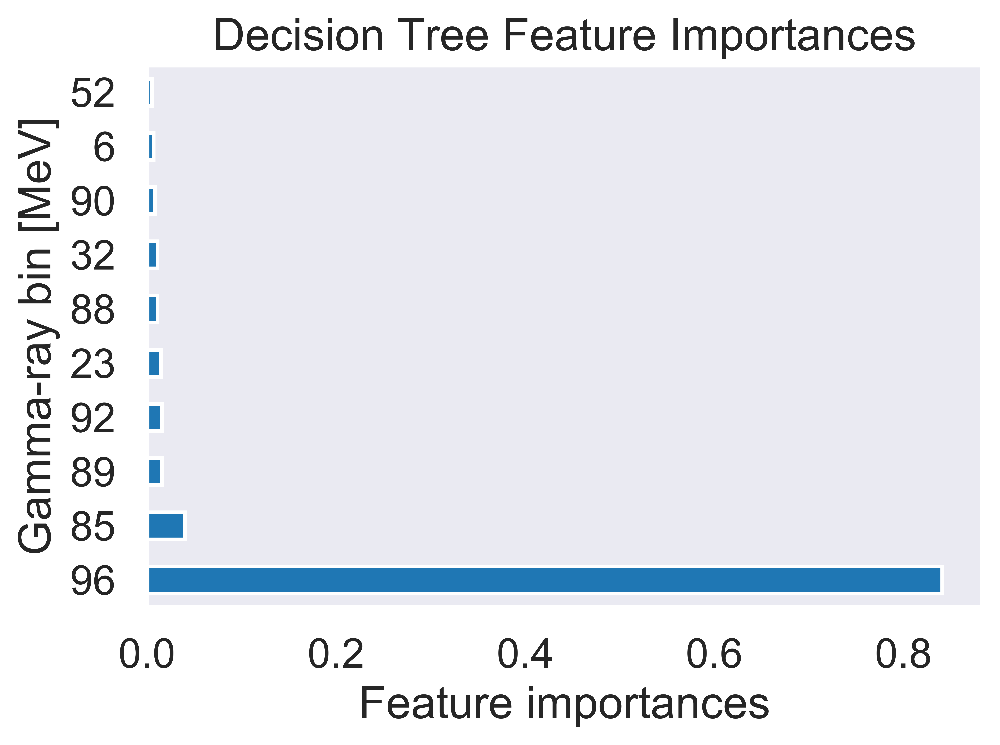

In [35]:
fig = plt.figure(figsize=(6,4), dpi=1200)
feat_importances = pd.Series(best_tree_reg.feature_importances_)
feat_importances.nlargest(10).plot(kind='barh')
plt.title("Decision Tree Feature Importances")
plt.xlabel("Feature importances")
plt.ylabel("Gamma-ray bin [MeV]")
plt.savefig('diss_figures/new_tree_feature_importances.png')

In [37]:
import os
graphviz_dir = r'C:\Users\awdre\Anaconda3\Library\bin\graphviz'
os.environ['PATH'] += os.pathsep + graphviz_dir

from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

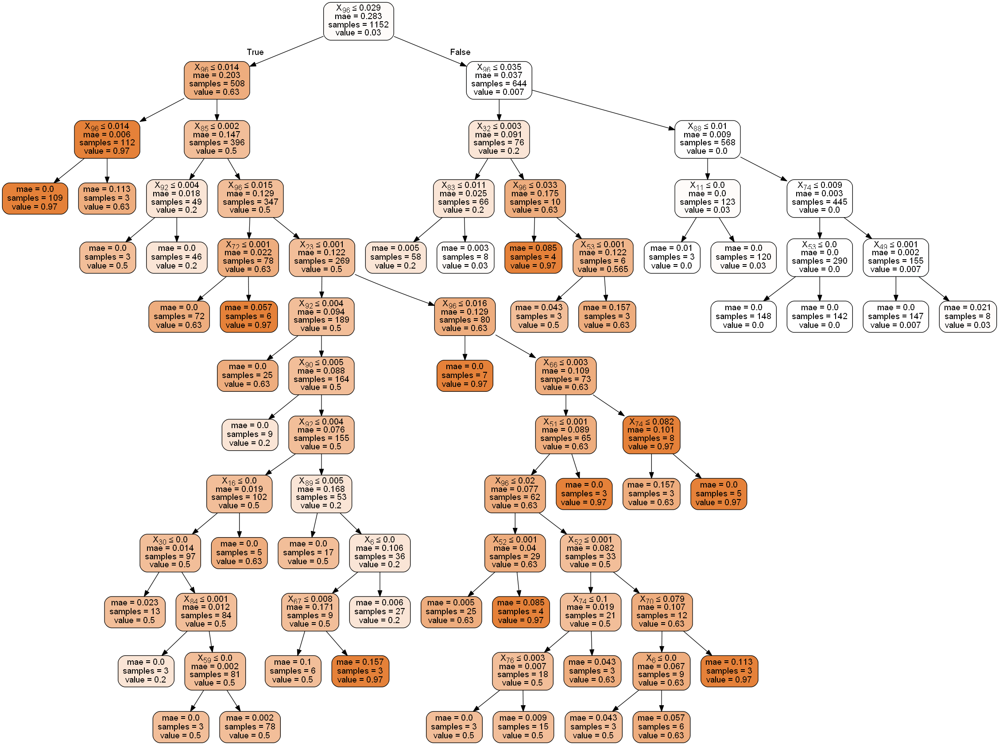

In [38]:
dot_data = StringIO()
export_graphviz(best_tree_reg, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [40]:
tick = time.time()
param_grid= [{
    'criterion': ['mae'], 'splitter': ['best'], 
    'max_depth': [16],  
    'min_samples_split': [2], 'min_samples_leaf': [5], 
    'max_features': [None], 'max_leaf_nodes': [20], 
    'random_state': [42]
}]

results_tree_reg, simple_tree_reg, tree_search, Message = model_gsearch_cval(
    model=DecisionTreeRegressor(), X_train=X_train, y_train=y_train,
    param_grid=param_grid, cv=5, scorer="neg_mean_absolute_error")
tock = time.time()
print("This grid-search took:", tock-tick, "seconds.")

Cross-validation statistics for best model: Scores: [-0.0148039  -0.01874762 -0.02248783 -0.02242087 -0.02431043] Mean: -0.020554129117259547 Standard Deviation: 0.0033959503665948517
This grid-search took: 2.7764248847961426 seconds.


<Figure size 7200x4800 with 0 Axes>

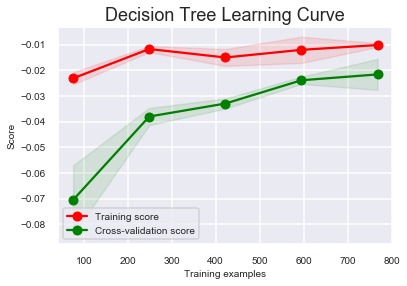

In [41]:
fig = plt.figure(figsize=(6,4), dpi=1200)
skplt.estimators.plot_learning_curve(simple_tree_reg, X_train, y_train,
                                    scoring="neg_mean_absolute_error")
plt.title('Decision Tree Learning Curve')
plt.savefig('diss_figures/tree_learning_curve.png')
plt.show()

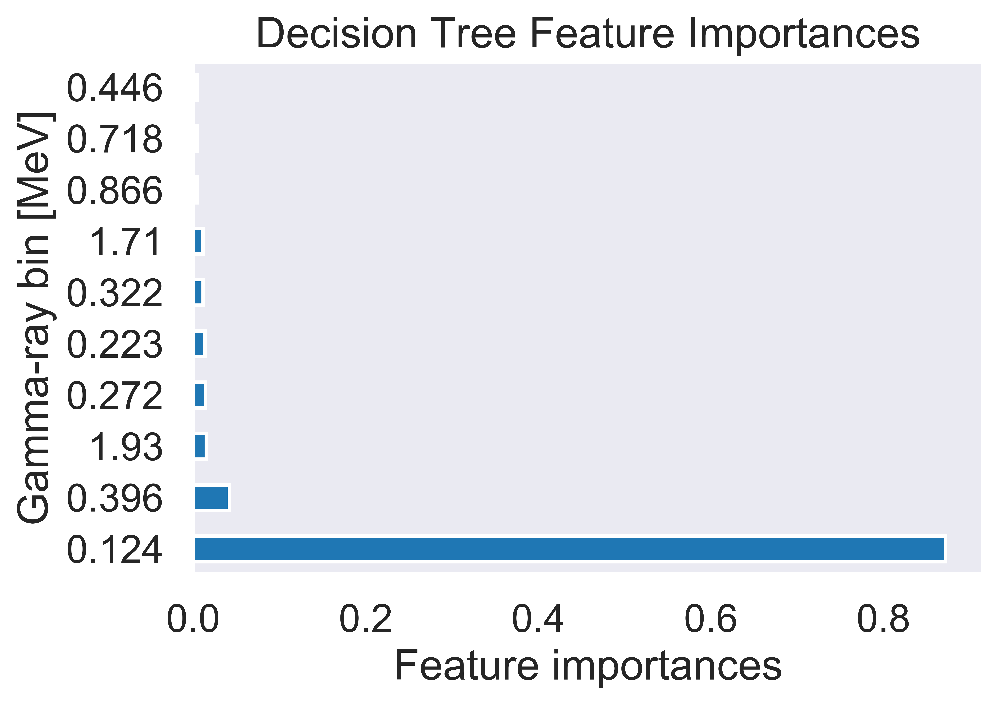

In [42]:
fig = plt.figure(figsize=(6,4), dpi=1200)
feat_importances = pd.Series(simple_tree_reg.feature_importances_, 
                             index=np.round(columns, decimals=3))
feat_importances.nlargest(10).plot(kind='barh')
plt.title("Decision Tree Feature Importances")
plt.xlabel("Feature importances")
plt.ylabel("Gamma-ray bin [MeV]")
plt.savefig('diss_figures/new_tree_feature_importances.png')

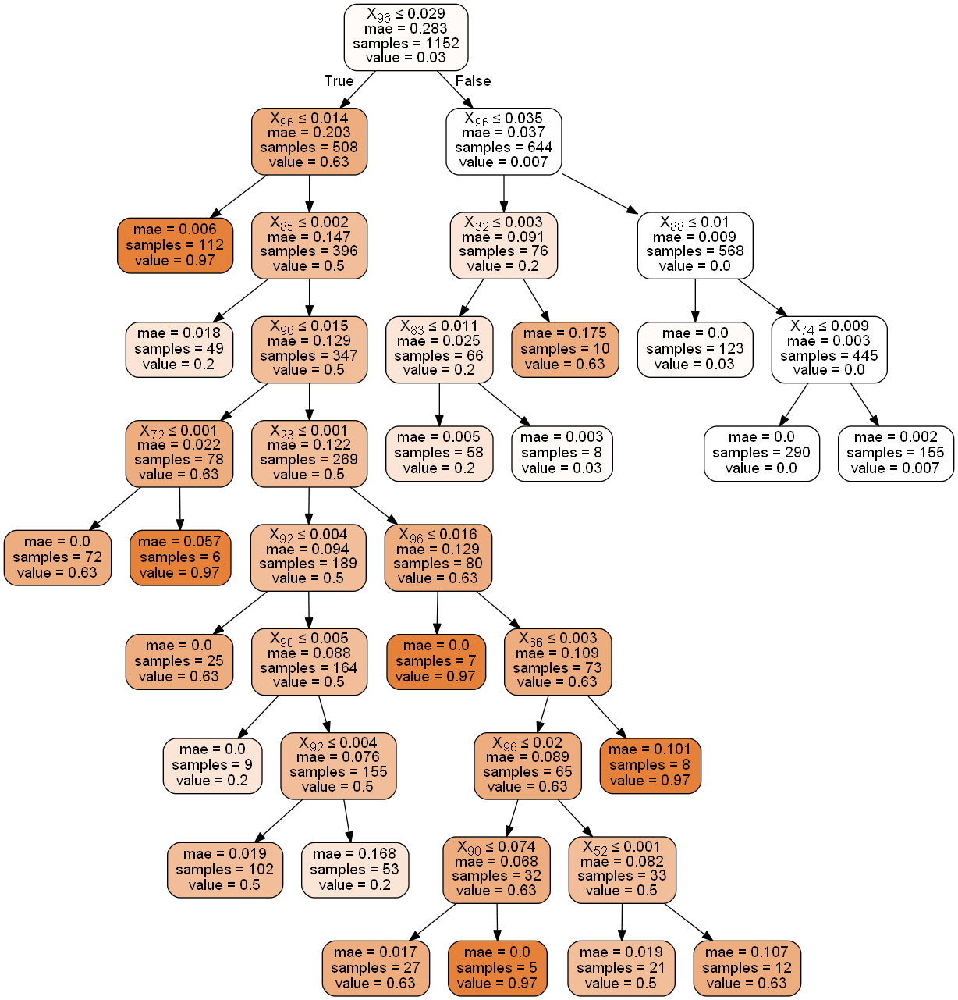

In [43]:
dot_data = StringIO()
export_graphviz(simple_tree_reg, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

## Random Forest Regressor

In [44]:
t = time.time()

param_grid= [{
    'n_estimators': [256],
    'criterion': ['mae'], 
    'max_depth': [12, 24],  
    'min_samples_split': [2], 
    'min_samples_leaf': [1], 
    'max_features': [40], 
    'max_leaf_nodes': [45, 55],
    'random_state': [42],
    'n_jobs': [-1]
}]

results_for_reg, best_for_reg, for_search, Message = model_gsearch_cval(
    model=RandomForestRegressor(), X_train=X_train, y_train=y_train,
    param_grid=param_grid, cv=5, scorer="neg_mean_absolute_error")

elapsed = time.time() - t
print(elapsed)

Cross-validation statistics for best model: Scores: [-0.01165141 -0.01882462 -0.02363865 -0.02292621 -0.02099728] Mean: -0.019607635989407183 Standard Deviation: 0.0043152701847114
84.91806626319885


In [45]:
best_for_reg

RandomForestRegressor(bootstrap=True, criterion='mae', max_depth=24,
                      max_features=40, max_leaf_nodes=55,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=256, n_jobs=-1,
                      oob_score=False, random_state=42, verbose=0,
                      warm_start=False)

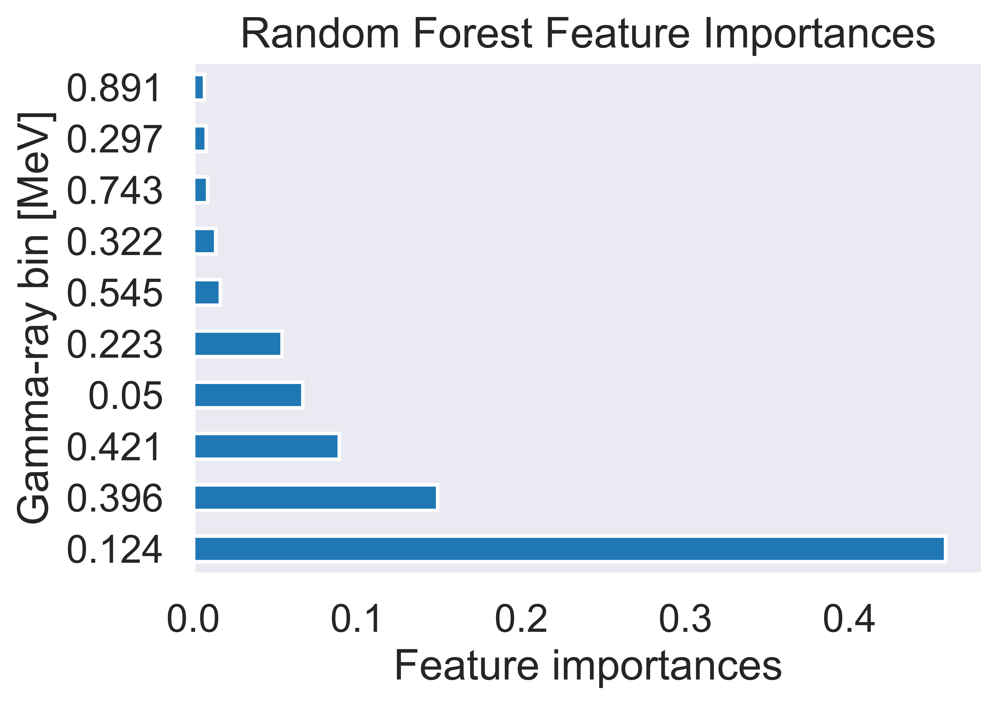

In [49]:
fig = plt.figure(figsize=(6,4), dpi=1200)
feat_importances = pd.Series(best_for_reg.feature_importances_,
                             index=np.round(columns, decimals=3))
feat_importances.nlargest(10).plot(kind='barh')
plt.title("Random Forest Feature Importances")
plt.xlabel("Feature importances")
plt.ylabel("Gamma-ray bin [MeV]")
plt.savefig('diss_figures/new_forest_feature_importances.png')

<Figure size 7200x4800 with 0 Axes>

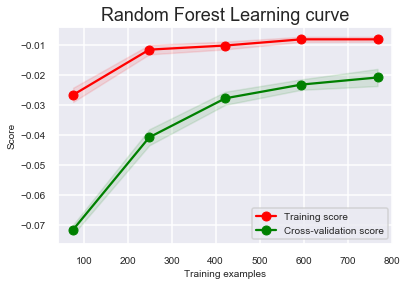

In [50]:
fig = plt.figure(figsize=(6,4), dpi=1200)
skplt.estimators.plot_learning_curve(best_for_reg, X_train, y_train,
                                    scoring="neg_mean_absolute_error")
plt.title("Random Forest Learning curve")
plt.show()

## Adaptive Boosting
Train iterative models. Update the weights of instances according to the prediction error of the prior model.
Predictor error rate $r_{j}$ $\rightarrow{}$ Predictor voting weight $\alpha_{j}$
$\rightarrow{}$ Instance weight update $w^{(i)}$
Predictor error rate: $$r_{j}=\frac{\sum_{i=1, \hat{y}_{j}^{(i)}\neq{}y^{(i)}}^{m}w^{(i)}}{\sum_{i=1}^{m}w^{(i)}}$$
Predictor voting weight: $$\alpha_{j}=\eta{}\log{\frac{1-r_{j}}{r_{j}}}$$
Data instance weight update:
for $i=1,2,...,m$  

$w^{(i)}\leftarrow{}\Bigg\{w^{(i)}$ if $\hat{y}^{i}_{j}=y^{(i)}, w^{(i)}\exp{(\alpha_{j})}$ if $\hat{y}_{j}^{(i)}\neq{}y^{(i)}$
$\hat{y}(\mathbf{x})=argmax_{k}\sum_{j=1, \hat{y}_{j}(\mathbf{x})=k}^{N}\alpha_{j}$

In [54]:
tick = time.time()
ada_reg = AdaBoostRegressor(base_estimator=DecisionTreeRegressor(
                                criterion='mae',
                                max_depth=4,
                                max_features=None,
                                max_leaf_nodes=20,
                                min_samples_leaf=5,
                                min_samples_split=2,
                                random_state=42),
                            n_estimators=30,
                            learning_rate=0.6,
                            random_state=42
                           )
score = cross_val_score(ada_reg, X=X_train, y=y_train, cv=5,
                       scoring='neg_mean_absolute_error')
print("The cross-validation MAE scores are:", score)
print("The average CV MAE score is:", np.mean(score))
tock = time.time() - tick
print("This process took:", tock, "seconds.")

The cross-validation MAE scores are: [-0.01266147 -0.01764026 -0.0216987  -0.01154696 -0.01580174]
The average CV MAE score is: -0.01586982458121589
This process took: 26.912250995635986 seconds.


In [55]:
ada_reg.fit(X_train, y_train)

AdaBoostRegressor(base_estimator=DecisionTreeRegressor(criterion='mae',
                                                       max_depth=4,
                                                       max_features=None,
                                                       max_leaf_nodes=20,
                                                       min_impurity_decrease=0.0,
                                                       min_impurity_split=None,
                                                       min_samples_leaf=5,
                                                       min_samples_split=2,
                                                       min_weight_fraction_leaf=0.0,
                                                       presort=False,
                                                       random_state=42,
                                                       splitter='best'),
                  learning_rate=0.6, loss='linear', n_estimators=30,
                  random_state

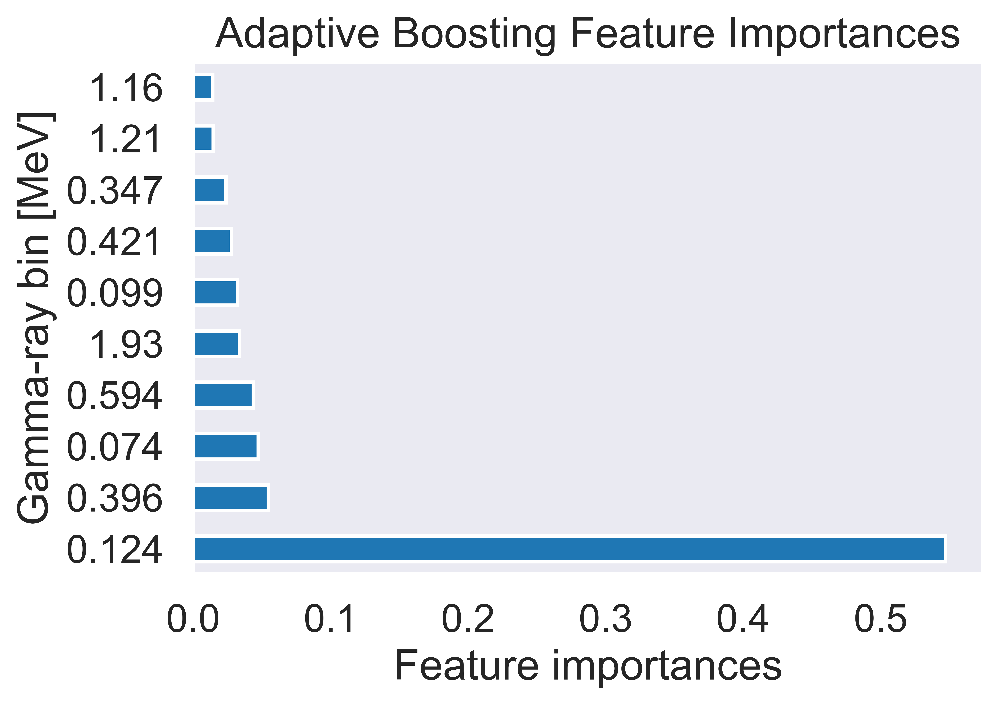

In [56]:
fig = plt.figure(figsize=(6,4), dpi=1200)
feat_importances = pd.Series(ada_reg.feature_importances_,
                             index=np.round(columns, decimals=3))
feat_importances.nlargest(10).plot(kind='barh')
plt.title("Adaptive Boosting Feature Importances")
plt.xlabel("Feature importances")
plt.ylabel("Gamma-ray bin [MeV]")
plt.savefig('diss_figures/ada_reg_feature_importances.png')

<Figure size 7200x4800 with 0 Axes>

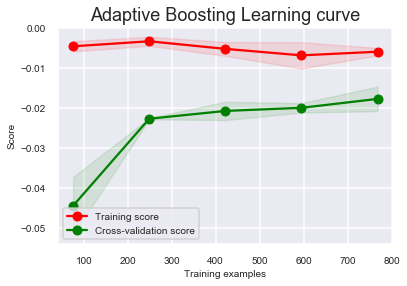

In [57]:
fig = plt.figure(figsize=(6,4), dpi=1200)
skplt.estimators.plot_learning_curve(ada_reg, X_train, y_train,
                                    scoring="neg_mean_absolute_error")
plt.title("Adaptive Boosting Learning curve")
plt.show()

# Full performance comparison

In [73]:
sns.set(style="darkgrid")

In [74]:
results_noise, names = reg_comp(seed=42, X_train=X_train, 
        y_train=y_train,
        X_test=X_test, y_test=y_test,
        ridge=best_ridge, decision_tree=simple_tree_reg,
        lasso=best_lasso, elastic_net=best_elastic,
        random_forest=best_for_reg,
        adaboost_reg=ada_reg)

Model: Mean (Standard Deviation)
Ridge: 0.215801 (0.168369)
Lasso: 0.215675 (0.170605)
Elastic Net: 0.215865 (0.169207)
Decision Tree: 0.018504 (0.076038)
Random Forest: 0.017571 (0.051304)
AdaBoost Forest: 0.017318 (0.069657)
